<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Chapter-Goals" data-toc-modified-id="Chapter-Goals-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Chapter Goals</a></span></li><li><span><a href="#Chapter-Outline" data-toc-modified-id="Chapter-Outline-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Chapter Outline</a></span></li><li><span><a href="#1.-Getting-and-Storing-a-Dataset" data-toc-modified-id="1.-Getting-and-Storing-a-Dataset-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>1. Getting and Storing a Dataset</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Getting-Stock-Data" data-toc-modified-id="Getting-Stock-Data-3.0.1"><span class="toc-item-num">3.0.1&nbsp;&nbsp;</span>Getting Stock Data</a></span></li><li><span><a href="#Create-and-Save-Return-Data-as-Parquet-file" data-toc-modified-id="Create-and-Save-Return-Data-as-Parquet-file-3.0.2"><span class="toc-item-num">3.0.2&nbsp;&nbsp;</span>Create and Save Return Data as Parquet file</a></span></li></ul></li></ul></li><li><span><a href="#2.-Defining-Stationarity" data-toc-modified-id="2.-Defining-Stationarity-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>2. Defining Stationarity</a></span></li><li><span><a href="#3.-How-Asset-Returns-Violate-Rules-of-Stationarity" data-toc-modified-id="3.-How-Asset-Returns-Violate-Rules-of-Stationarity-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>3. How Asset Returns Violate Rules of Stationarity</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#The-annual-means-and-standard-deviations-vary-signficantly-across-years." data-toc-modified-id="The-annual-means-and-standard-deviations-vary-signficantly-across-years.-5.0.1"><span class="toc-item-num">5.0.1&nbsp;&nbsp;</span>The annual means and standard deviations vary signficantly across years.</a></span></li></ul></li><li><span><a href="#A-Bayesian-Approach-to-Normality-(Student-T)-Testing" data-toc-modified-id="A-Bayesian-Approach-to-Normality-(Student-T)-Testing-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>A Bayesian Approach to Normality (Student T) Testing</a></span><ul class="toc-item"><li><span><a href="#How-Asset-Returns-Violate-Stationarity:-All-Data" data-toc-modified-id="How-Asset-Returns-Violate-Stationarity:-All-Data-5.1.1"><span class="toc-item-num">5.1.1&nbsp;&nbsp;</span>How Asset Returns Violate Stationarity: All Data</a></span></li><li><span><a href="#How-Asset-Returns-Violate-Stationarity-by-Year" data-toc-modified-id="How-Asset-Returns-Violate-Stationarity-by-Year-5.1.2"><span class="toc-item-num">5.1.2&nbsp;&nbsp;</span>How Asset Returns Violate Stationarity by Year</a></span></li></ul></li><li><span><a href="#The-final-test---Kolmogorov-Smirnov." data-toc-modified-id="The-final-test---Kolmogorov-Smirnov.-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>The final test - Kolmogorov-Smirnov.</a></span><ul class="toc-item"><li><span><a href="#KS-Two-Sample-Test-For-All-Years" data-toc-modified-id="KS-Two-Sample-Test-For-All-Years-5.2.1"><span class="toc-item-num">5.2.1&nbsp;&nbsp;</span>KS Two Sample Test For All Years</a></span></li><li><span><a href="#KS-Two-Sided-Test-By-Year" data-toc-modified-id="KS-Two-Sided-Test-By-Year-5.2.2"><span class="toc-item-num">5.2.2&nbsp;&nbsp;</span>KS Two-Sided Test By Year</a></span></li></ul></li><li><span><a href="#Examining-Autocorrelation" data-toc-modified-id="Examining-Autocorrelation-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Examining Autocorrelation</a></span></li><li><span><a href="#The-Error-of-Using-The-Wrong-Distributions-Summary-Metrics" data-toc-modified-id="The-Error-of-Using-The-Wrong-Distributions-Summary-Metrics-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>The Error of Using The Wrong Distributions Summary Metrics</a></span></li></ul></li><li><span><a href="#4.-TODO:-UPDATE-Conclusions" data-toc-modified-id="4.-TODO:-UPDATE-Conclusions-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>4. TODO: UPDATE Conclusions</a></span></li></ul></div>

## Chapter Goals

1. Understand the basics of stationarity
2. Understand how asset returns violate the rules of stationarity
3. Demonstrate that concept that asset returns can be considered as being generated by different distributions
4. Motivating the use of a more robust prediction methodology    

## Chapter Outline

1. Getting and Storing a Dataset
2. Defining Stationarity
3. How Asset Returns Violate Rules of Stationarity
4. Conclusions

## 1. Getting and Storing a Dataset

Start by importing the required modules and tools

In [1]:
%load_ext watermark
%watermark

%load_ext autoreload
%autoreload 2

from IPython.display import display

# import standard libs
from pathlib import PurePath, Path
import sys
import time
import os
import pickle
os.environ['THEANO_FLAGS'] = 'device=cpu,floatX=float32'

# get project dir
pp = PurePath(Path.cwd()).parts[:-1]
pdir = PurePath(*pp)
data_dir = pdir/'data'
script_dir = pdir / 'scripts' 
sys.path.append(script_dir.as_posix())

# import python scientific stack
import pandas as pd
pd.options.display.float_format = '{:,.4f}'.format
import pandas_datareader.data as web
import numpy as np
import sklearn.mixture as mix
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as stats
from numba import jit
import math
import pymc3 as pm
from theano import shared, theano as tt
from multiprocessing import cpu_count

# import visual tools
from mpl_toolkits import mplot3d
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline
import plotnine as pn
import mizani.breaks as mzb
import mizani.formatters as mzf
import seaborn as sns
savefig_kwds=dict(dpi=300, bbox_inches='tight')
# import util libs
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")
from utils import cprint

# set globals
plt.style.use('seaborn-talk')
plt.style.use('bmh')
plt.rcParams['font.family'] = 'Bitstream Vera Sans'#'DejaVu Sans Mono'
#plt.rcParams['font.size'] = 9.5
plt.rcParams['font.weight'] = 'medium'
plt.rcParams['figure.figsize'] = 10,7

blue, green, red, purple, gold, teal = sns.color_palette('colorblind', 6)
RANDOM_STATE = 777

print()
%watermark -p pandas,pandas_datareader,numpy,sklearn,statsmodels,scipy,pymc3,matplotlib,seaborn,plotnine

2018-10-02T00:09:09+08:00

CPython 3.6.6
IPython 6.5.0

compiler   : MSC v.1900 64 bit (AMD64)
system     : Windows
release    : 10
machine    : AMD64
processor  : Intel64 Family 6 Model 78 Stepping 3, GenuineIntel
CPU cores  : 4
interpreter: 64bit

pandas 0.23.4
pandas_datareader 0.7.0
numpy 1.13.3
sklearn 0.20.0
statsmodels 0.9.0
scipy 1.1.0
pymc3 3.5
matplotlib 3.0.0
seaborn 0.8.0
plotnine 0.4.0


#### Getting Stock Data 

First let's get some market data from Morningstar. Yahoo Finance api is deprecated for now. We'll get the closing price for multiple ETFs.

In [5]:
get_price = lambda sym, start, end: web.DataReader(sym, 'yahoo', start, end)['Adj Close']

chosen_syms = ['SPY', 'QQQ', 'TLT', 'GLD', 'EFA', 'EEM']


end = pd.to_datetime('2017-12-31')
start = end - 25 * 252 * pd.tseries.offsets.BDay()

df = (pd.DataFrame
      .from_dict({sym:get_price(sym, start, end)
                  for sym in chosen_syms}))
cprint(df)

# save price data
outfp = PurePath(data_dir/'etf_prices_2004-11-19-2017-12-31.parq')
df.to_parquet(outfp)

-------------------------------------------------------------------------------
dataframe information
-------------------------------------------------------------------------------
                SPY      QQQ      TLT      GLD     EFA     EEM
Date                                                          
2017-12-22 264.0565 156.4979 122.6058 120.9400 68.7441 46.1982
2017-12-26 263.7406 155.6526 122.9693 121.7700 68.7245 46.1584
2017-12-27 263.8689 155.6725 124.5711 122.2300 68.8520 46.2777
2017-12-28 264.4118 155.8615 124.4630 122.8500 68.8912 46.5956
2017-12-29 263.4149 154.8968 124.6595 123.6500 68.9402 46.8142
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6081 entries, 1993-11-08 to 2017-12-29
Data columns (total 6 columns):
SPY    6081 non-null float64
QQQ    4735 non-null float64
TLT    3884 non-null float64
GLD    3302 non-null float64
EFA    4112 non-null float64
EEM    3706 non-null float64
dtypes: float64(6)
memory us

#### Create and Save Return Data as Parquet file

Please note that although this dataset is small enough to save as csv or h5, if you intend on dealing with larger datasets aka "big data" on "distributed systems" I recommend developing the `parquet` habit now. This will save you time and storage costs down the road.

In [6]:
# compute returns

R = np.log(df/df.shift(1)).dropna()
cprint(R)

outfp = PurePath(data_dir/'etf_returns_2004-11-19-2017-12-31.parq')
R.to_parquet(outfp)

-------------------------------------------------------------------------------
dataframe information
-------------------------------------------------------------------------------
               SPY     QQQ     TLT    GLD     EFA     EEM
Date                                                     
2017-12-22 -0.0003 -0.0011  0.0014 0.0052  0.0026  0.0084
2017-12-26 -0.0012 -0.0054  0.0030 0.0068 -0.0003 -0.0009
2017-12-27  0.0005  0.0001  0.0129 0.0038  0.0019  0.0026
2017-12-28  0.0021  0.0012 -0.0009 0.0051  0.0006  0.0068
2017-12-29 -0.0038 -0.0062  0.0016 0.0065  0.0007  0.0047
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3301 entries, 2004-11-19 to 2017-12-29
Data columns (total 6 columns):
SPY    3301 non-null float64
QQQ    3301 non-null float64
TLT    3301 non-null float64
GLD    3301 non-null float64
EFA    3301 non-null float64
EEM    3301 non-null float64
dtypes: float64(6)
memory usage: 180.5 KB
None
----------------

After saving the data we can load back into the environment like so...

In [7]:
infp = PurePath(data_dir/'etf_returns_2004-11-19-2017-12-31.parq')
R = (pd.read_parquet(infp)
     .assign(year=lambda df: df.index.year)) # add year column for later conv.
cprint(R)

-------------------------------------------------------------------------------
dataframe information
-------------------------------------------------------------------------------
               SPY     QQQ     TLT    GLD     EFA     EEM  year
Date                                                           
2017-12-22 -0.0003 -0.0011  0.0014 0.0052  0.0026  0.0084  2017
2017-12-26 -0.0012 -0.0054  0.0030 0.0068 -0.0003 -0.0009  2017
2017-12-27  0.0005  0.0001  0.0129 0.0038  0.0019  0.0026  2017
2017-12-28  0.0021  0.0012 -0.0009 0.0051  0.0006  0.0068  2017
2017-12-29 -0.0038 -0.0062  0.0016 0.0065  0.0007  0.0047  2017
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3301 entries, 2004-11-19 to 2017-12-29
Data columns (total 7 columns):
SPY     3301 non-null float64
QQQ     3301 non-null float64
TLT     3301 non-null float64
GLD     3301 non-null float64
EFA     3301 non-null float64
EEM     3301 non-null float64
year    3301 no

Please be aware that the load function used above immediately converts the `parquet` file into a `pandas.DataFrame` object. For smaller datasets and modern laptop hardware that is not a problem (less than 1 `gb`). However once your dataset starts getting into the multi `gb` range one might experience delayed performance in which case I would recommend learning and using [Dask](http://dask.pydata.org/en/latest/).

## 2. Defining Stationarity

The following image sums up this concept best. The simple intuition is that the series mean and variance should NOT change as a result of passing time. The covariance between returns in the time series should also NOT be a function of time.

## 3. How Asset Returns Violate Rules of Stationarity

Now that you are familiarized with the concept of stationary time series, the remainder of this notebook will demonstrate/discuss some of the nuances and challenges one runs into in when trying to predict time series. 

Before we start just know that the behavior of securities' returns challenges these requirements of stationarity and our attempts to predict them in ways that are sometimes unknowable. This is a very humbling realization but is a necessary fact that requires a strategic response in the practice of return prediction.

#### The annual means and standard deviations vary signficantly across years.

One way we can examine whether the returns are stationary is looking at the mean and standard deviation of returns by year. If those two quantities are not supposed to be a function of time then they should be pretty similar across years, right?

Just by eyeballing the plots below you can see how varied the means and volatilities are. Sometimes the mean return is highly negative while volatility is spiked like in 2008-09 or it can be positive while volatlility is much lower as in 2017. 

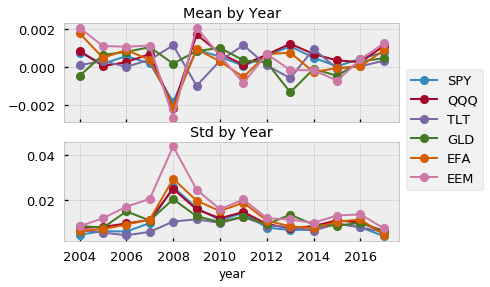

In [9]:
#for sym in R.columns[:-1]:
f,axes = plt.subplots(2, sharex=True)
(R.groupby('year').agg(['mean']).plot(ax=axes[0],marker='o'));
(R.groupby('year').agg(['std']).plot(ax=axes[1],marker='o'));
axes[0].legend(R.columns[:-1], bbox_to_anchor=(1.0, .6))
axes[1].legend().set_visible(False)
axes[0].set_title('Mean by Year')
axes[1].set_title('Std by Year');

We can look at the KDE plots of the distributions by year and see that for for every symbol, each year the distribution is different in height and width when compared to other years.

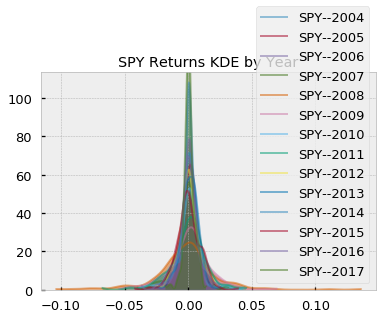

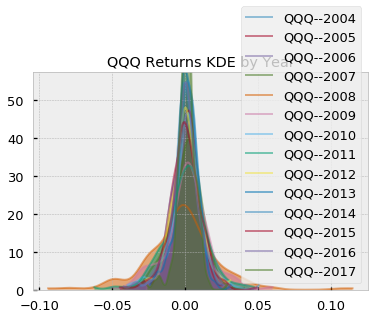

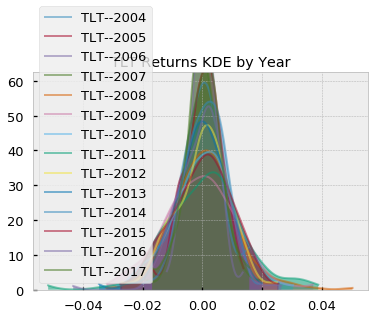

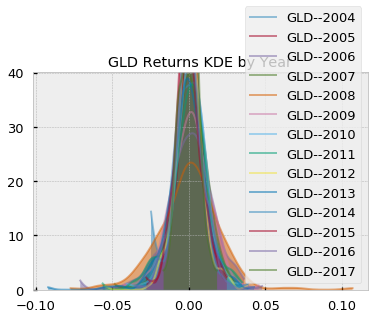

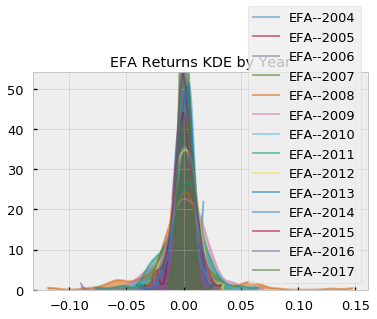

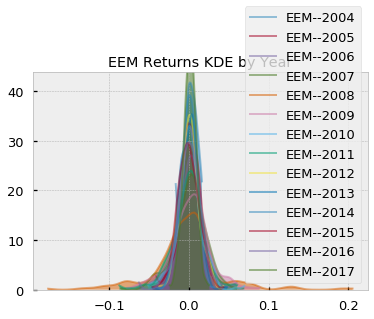

In [10]:
for sym in R.columns[:-1]:
    f, ax = plt.subplots()
    for year in R.year.unique():
        sns.kdeplot(R.query('year==@year')[sym], ax=ax,
                    shade=True, label=f'{sym}--{year}', cut=0, alpha=0.5)
    plt.title(f'{sym} Returns KDE by Year')

We can see the same result by looking at the cumulative distribution as well.

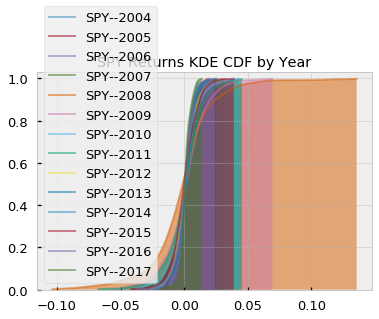

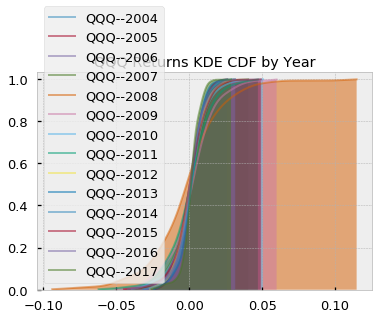

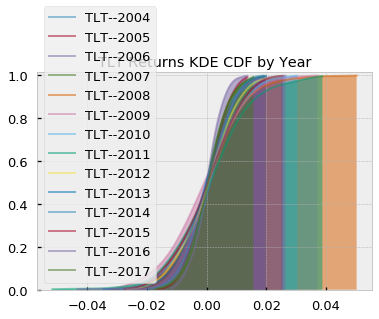

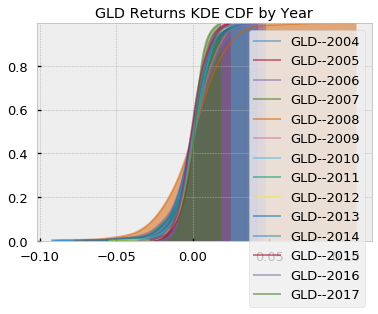

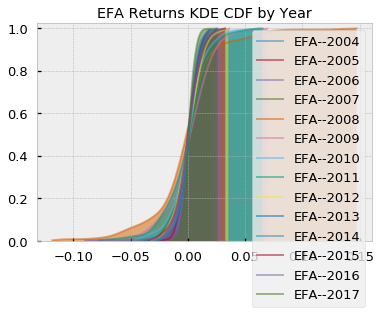

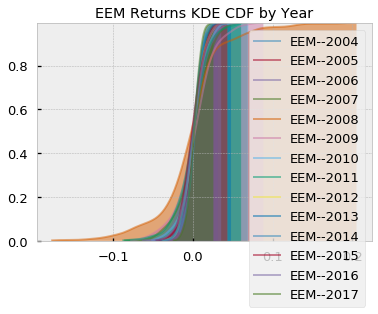

In [11]:
for sym in R.columns[:-1]:
    f, ax = plt.subplots()
    for year in R.year.unique():
        sns.kdeplot(R.query('year==@year')[sym], ax=ax,
                    shade=True, label=f'{sym}--{year}', cut=0, 
                    cumulative=True, alpha=0.5)
    plt.title(f'{sym} Returns KDE CDF by Year')

### A Bayesian Approach to Normality (Student T) Testing

Many tutorials take a more traditional approach to normality testing. Most often one would use a test like the Shapiro-Wilks, or Kolmogorov-Smirnov which computes a test-statistic and a p-value which should tell us whether or not we can reject our carefully crafted hypothesis. 

Originally this is also what I did but in truth, I find the Bayesian approach much more intuitive. In this approach we do the following:
1. First we simulate a random student t distributed series with the same mean and standard deviation as our actual return series. 
2. We then set up a Bayesian model for the actual return series. 
3. We use MCMC to draw samples from each distribution
4. We compare the distributions of the sampled returns to determine the difference in means and standard deviations.

In [12]:
sim_t_series = lambda s,mu,std: stats.t.rvs(df=2, loc=mu, scale=std,
                                            size=s.shape[0], 
                                            random_state=RANDOM_STATE)


def model_best(real, real_label, **sample_kwds):
    """
    fn adapted from:
        https://github.com/quantopian/pyfolio/blob/master/pyfolio/bayesian.py
        http://docs.pymc.io/notebooks/BEST.html
        
    Params
    ------
    real : array-like
        returns
    real_label : str()
    **sample_kwds : keyword args for pymc sampler
        
    Returns
    -------
    model : pymc3 model object
    trace : pymc3 trace object
    """
    
    mean_returns = real.mean()
    std_returns = real.std()*2
    
    simulated_series = sim_t_series(real, mean_returns, std_returns)
    
    with pm.Model() as model:
        real_mean = pm.Normal(f'{real_label}_mean', mu=mean_returns, sd=std_returns, testval=mean_returns)
        simulated_mean = pm.Normal('simulated_mean', mu=mean_returns, sd=std_returns, testval=mean_returns)

        real_sigma = pm.HalfCauchy(f'{real_label}_volatility', beta=1, testval=std_returns)
        simulated_sigma = pm.HalfCauchy('simulated_volatility', beta=1, testval=std_returns)

        nu = pm.Exponential('nu_minus_two', 1/10, testval=3.)

        cross_section_returns = pm.StudentT(f'{real_label}_returns', nu=nu+2, 
                                            mu=real_mean, sd=real_sigma,
                                            observed=real)
        simulated_returns = pm.StudentT('simulated_returns', nu=nu+2, 
                                        mu=simulated_mean, sd=simulated_sigma,
                                        observed=simulated_series)

        diff_of_means = pm.Deterministic(f'{real_label}_difference_of_means', 
                                         real_mean-simulated_mean)
        diff_of_stds = pm.Deterministic(f'{real_label}_difference_of_stds',
                                        real_sigma-simulated_sigma)
        effect_size = pm.Deterministic(
            'effect_size',diff_of_means/np.sqrt((real_sigma**2 \
                                                 + simulated_sigma**2)/2)
        )
        
        trace = pm.sample(**sample_kwds)  
        
    return model, trace

def plot_posteriors(trace, real_label):
    pm.plot_posterior(trace, varnames=[f'{real_label}_mean','simulated_mean', 
                                       f'{real_label}_volatility','simulated_volatility',
                                       'nu_minus_two'], color='#87ceeb');
    pm.plot_posterior(trace, varnames=[f'{real_label}_difference_of_means',
                                       f'{real_label}_difference_of_stds', 'effect_size'],
                      ref_val=0,
                      color='#87ceeb');      

#### How Asset Returns Violate Stationarity: All Data

In [13]:
samples = 2000 # number of draws from MCMC
SAMPLE_KWDS = dict(draws=samples, tune=samples,
                   init='advi+adapt_diag', # init chain algo
                   cores=cpu_count()-2,# number of available cpus
                   nuts_kwargs={'target_accept':0.9}, # acceptance prob. tgt.
                   random_seed=RANDOM_STATE) # reproducibility

In [ ]:
models = {}
traces = {}
for sym in R.columns[:-1]: # last column is year
    real = R[sym].values
    model, trace = model_best(real, real_label=sym, **SAMPLE_KWDS)
    models[sym] = model
    traces[sym] = trace

Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -16,588:  19%|█████████▋                                        | 38991/200000 [01:14<04:51, 551.86it/s]
Convergence achieved at 39000
Interrupted at 38,999 [19%]: Average Loss = -7,705.1


In [ ]:
for sym,trc in traces.items():    
    plot_posteriors(trc, real_label=sym)

#### How Asset Returns Violate Stationarity by Year

We can run the same bayesian estimation test by year. For this example we will focus on the `SPY` ETF. 

In [22]:
years = R.year.unique()[1:] # 2005 is first full year
print(years)
print('-'*77)

nested_models = {}
nested_traces = {}
for sym in R.columns[:-1]:
    print('-'*77)
    print(f'begin bayesian estimation by year for {sym}...')
    tmp_models = {}
    tmp_traces = {}
    for year in years:
        real = R.query('year==@year')[sym].values
        model, trace = model_best(real, real_label=f'{sym}-{year}', **SAMPLE_KWDS)
        tmp_models[year] = model
        tmp_traces[year] = trace
    nested_models[sym] = tmp_models
    nested_traces[sym] = tmp_traces

[2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017]
-----------------------------------------------------------------------------
-----------------------------------------------------------------------------
begin bayesian estimation by year for SPY...


Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,555.4:  17%|█▋        | 33337/200000 [00:20<01:40, 1661.64it/s]
Convergence archived at 33400
Interrupted at 33,399 [16%]: Average Loss = -218.25
Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nu_minus_two_log__, simulated_volatility_log__, SPY-2005_volatility_log__, simulated_mean, SPY-2005_mean]
100%|██████████| 4000/4000 [00:13<00:00, 301.07it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,583.2:  17%|█▋        | 33851/200000 [00:20<01:38, 1680.70it/s]
Convergence archived at 34000
Interrupted at 33,999 [16%]: Average Loss = -245.45
Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nu_minus_two_log__, simulated_volatility_log__, SPY-2006_volatility_log__, simulated_mean, SPY-2006_mean]
100%|██████████| 4000/4000 [00:14<00:00, 274.62it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,362.6:  17%|█▋

-----------------------------------------------------------------------------
begin bayesian estimation by year for QQQ...


Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,420.9:  16%|█▌        | 32481/200000 [00:16<01:25, 1950.61it/s]
Convergence archived at 32700
Interrupted at 32,699 [16%]: Average Loss = -318.08
Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nu_minus_two_log__, simulated_volatility_log__, QQQ-2005_volatility_log__, simulated_mean, QQQ-2005_mean]
100%|██████████| 4000/4000 [00:14<00:00, 281.23it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,346.8:  16%|█▋        | 32631/200000 [00:16<01:23, 1995.42it/s]
Convergence archived at 32800
Interrupted at 32,799 [16%]: Average Loss = -354.26
Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nu_minus_two_log__, simulated_volatility_log__, QQQ-2006_volatility_log__, simulated_mean, QQQ-2006_mean]
100%|██████████| 4000/4000 [00:14<00:00, 278.14it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,282.1:  16%|█▌

-----------------------------------------------------------------------------
begin bayesian estimation by year for TLT...


Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,588.6:  16%|█▌        | 32451/200000 [00:16<01:26, 1942.67it/s]
Convergence archived at 32500
Interrupted at 32,499 [16%]: Average Loss = -168.75
Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nu_minus_two_log__, simulated_volatility_log__, TLT-2005_volatility_log__, simulated_mean, TLT-2005_mean]
100%|██████████| 4000/4000 [00:14<00:00, 269.74it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,721:  18%|█▊        | 35621/200000 [00:18<01:23, 1973.01it/s]  
Convergence archived at 35800
Interrupted at 35,799 [17%]: Average Loss = -109.52
Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nu_minus_two_log__, simulated_volatility_log__, TLT-2006_volatility_log__, simulated_mean, TLT-2006_mean]
100%|██████████| 4000/4000 [00:16<00:00, 242.98it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,606.9:  18%|█▊

-----------------------------------------------------------------------------
begin bayesian estimation by year for GLD...


Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,461.4:  17%|█▋        | 33376/200000 [00:16<01:24, 1979.27it/s]
Convergence archived at 33400
Interrupted at 33,399 [16%]: Average Loss = -322.69
Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nu_minus_two_log__, simulated_volatility_log__, GLD-2005_volatility_log__, simulated_mean, GLD-2005_mean]
100%|██████████| 4000/4000 [00:15<00:00, 258.24it/s]
The acceptance probability does not match the target. It is 0.6915935016908373, but should be close to 0.9. Try to increase the number of tuning steps.
Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,135.4:  16%|█▌        | 31091/200000 [00:16<01:28, 1912.11it/s]
Convergence archived at 31100
Interrupted at 31,099 [15%]: Average Loss = -349.15
Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nu_minus_two_log__, simulated_volatility_log__, GLD-2006_volatility_log__, simulated_mean, GLD-2006_mean]
100%|██

-----------------------------------------------------------------------------
begin bayesian estimation by year for EFA...


Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,485:  17%|█▋        | 33201/200000 [00:18<01:31, 1817.32it/s]  
Convergence archived at 33300
Interrupted at 33,299 [16%]: Average Loss = -296.78
Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nu_minus_two_log__, simulated_volatility_log__, EFA-2005_volatility_log__, simulated_mean, EFA-2005_mean]
100%|██████████| 4000/4000 [00:14<00:00, 269.27it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,382:  17%|█▋        | 33549/200000 [00:18<01:30, 1847.91it/s]  
Convergence archived at 33600
Interrupted at 33,599 [16%]: Average Loss = -386.17
Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nu_minus_two_log__, simulated_volatility_log__, EFA-2006_volatility_log__, simulated_mean, EFA-2006_mean]
100%|██████████| 4000/4000 [00:16<00:00, 246.77it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,271.6:  16%|█▌

-----------------------------------------------------------------------------
begin bayesian estimation by year for EEM...


Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,239.1:  16%|█▌        | 31242/200000 [00:16<01:26, 1943.30it/s]
Convergence archived at 31400
Interrupted at 31,399 [15%]: Average Loss = -348.07
Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nu_minus_two_log__, simulated_volatility_log__, EEM-2005_volatility_log__, simulated_mean, EEM-2005_mean]
100%|██████████| 4000/4000 [00:14<00:00, 277.16it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -1,061.5:  15%|█▌        | 30381/200000 [00:15<01:25, 1990.41it/s]
Convergence archived at 30400
Interrupted at 30,399 [15%]: Average Loss = -335.74
Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nu_minus_two_log__, simulated_volatility_log__, EEM-2006_volatility_log__, simulated_mean, EEM-2006_mean]
100%|██████████| 4000/4000 [00:15<00:00, 257.19it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = -979.65:  15%|█▍ 

In [23]:
## save to pickle format

models_outfp = PurePath(data_dir/'student_t_nested_models_advi.pkl')
with open(models_outfp, 'wb') as buff:
    pickle.dump(nested_models, buff)
    
traces_outfp = PurePath(data_dir/'student_t_nested_traces_advi.pkl')
with open(traces_outfp, 'wb') as buff:
    pickle.dump(nested_traces, buff)

In [24]:
## demo load pickled data for analysis

models_infp = PurePath(data_dir/'student_t_nested_models_advi.pkl')
with open(models_infp, 'rb') as buff:
    nested_models = pickle.load(buff)
    
traces_infp = PurePath(data_dir/'student_t_nested_traces_advi.pkl')
with open(traces_infp, 'rb') as buff:
    nested_traces = pickle.load(buff)

Now we plot the posteriors of the difference in means, stds, and effect size.

EEM years: 100%|██████████| 6/6 [00:39<00:00,  6.51s/it]


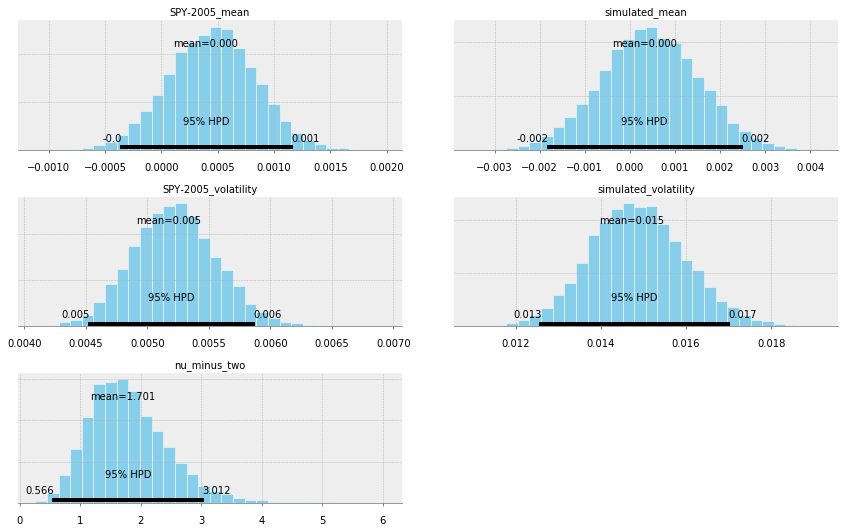

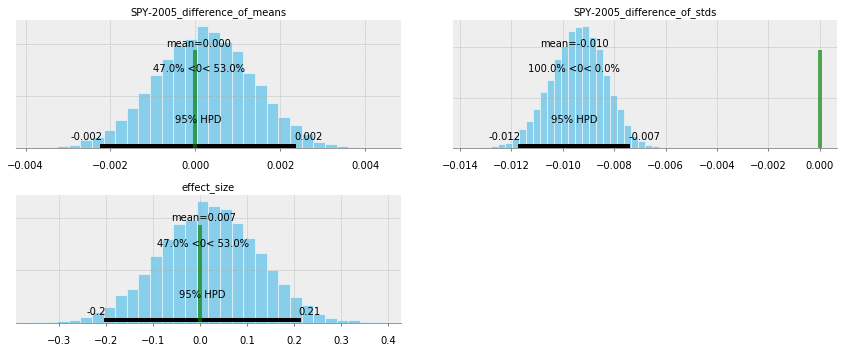

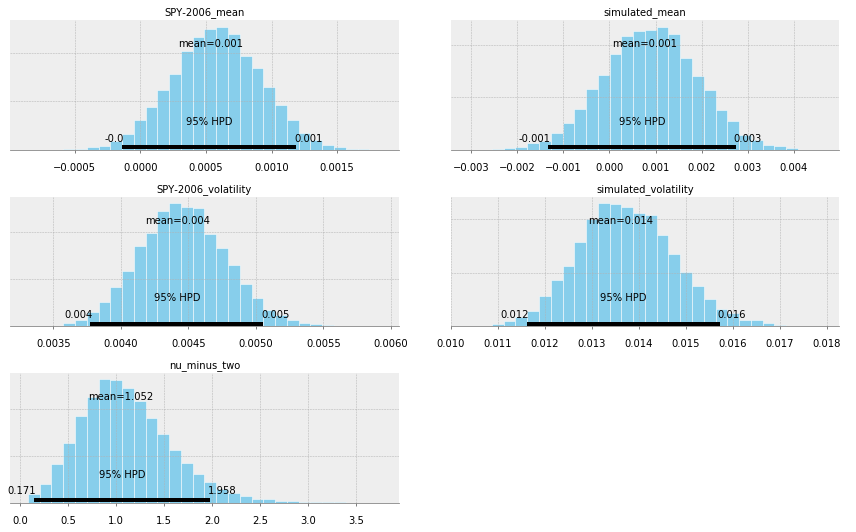

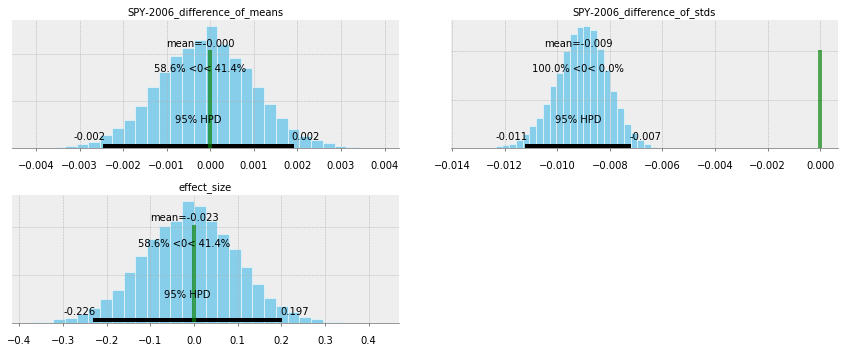

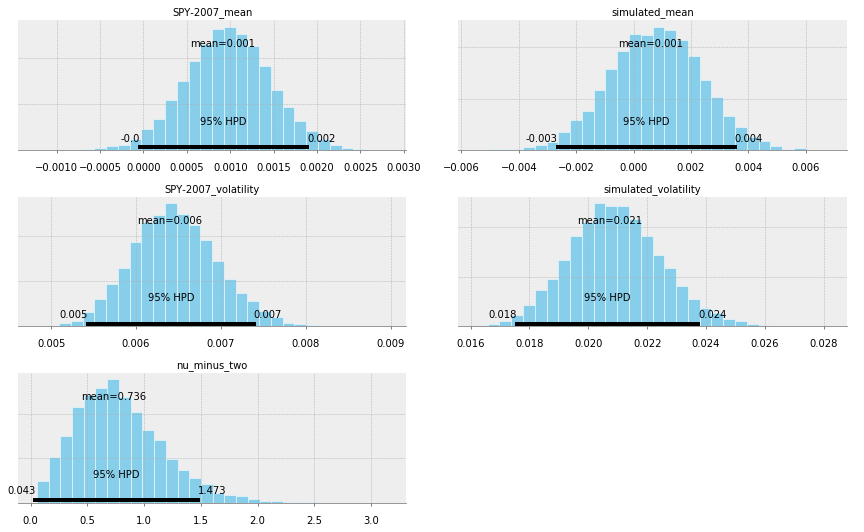

...

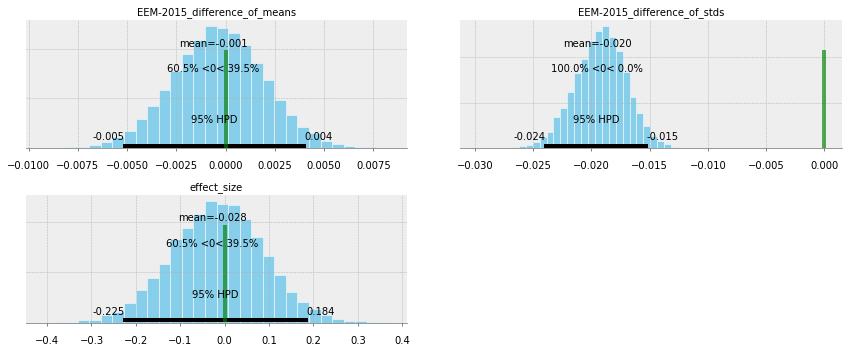

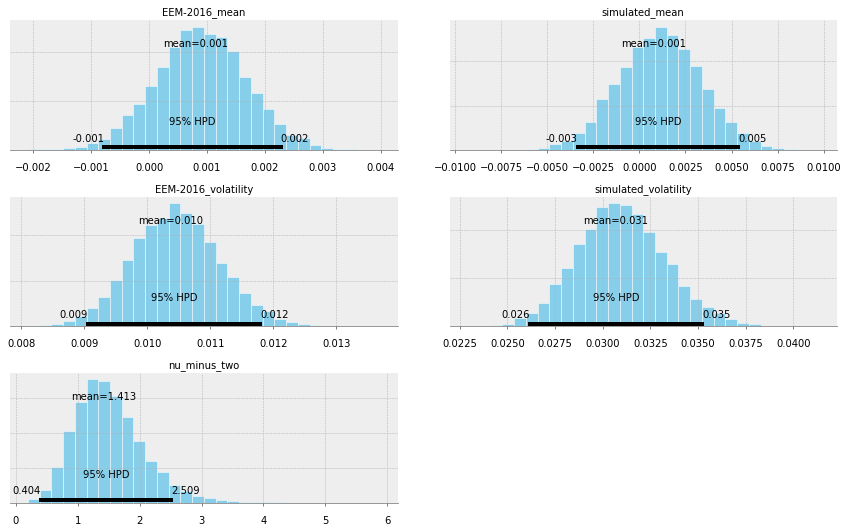

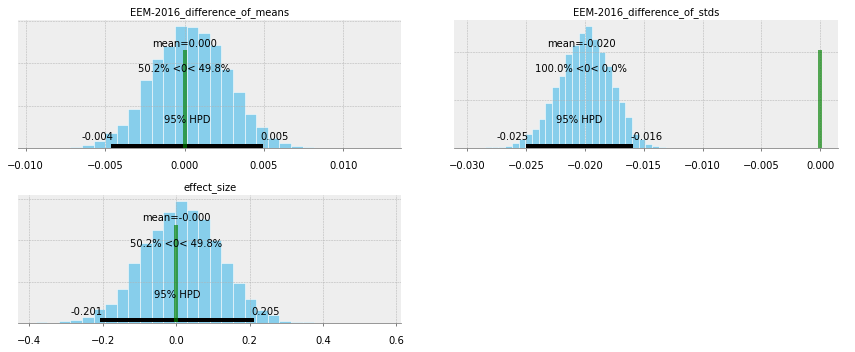

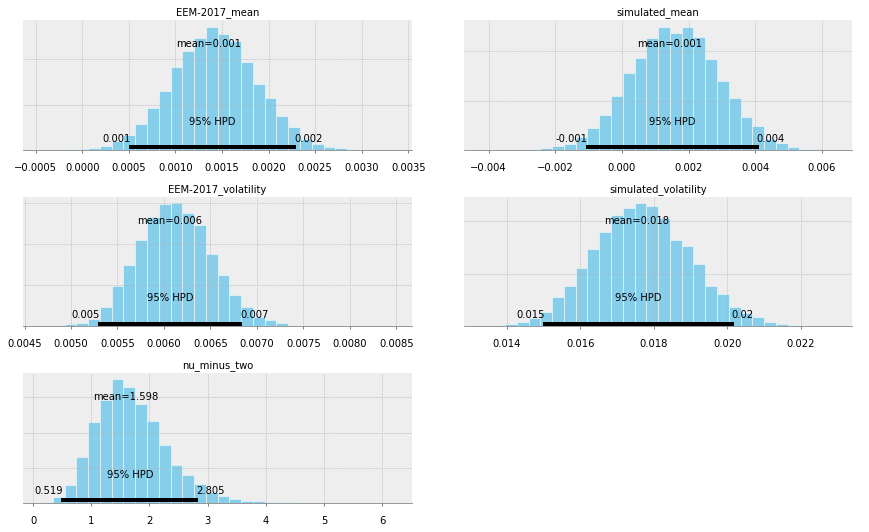

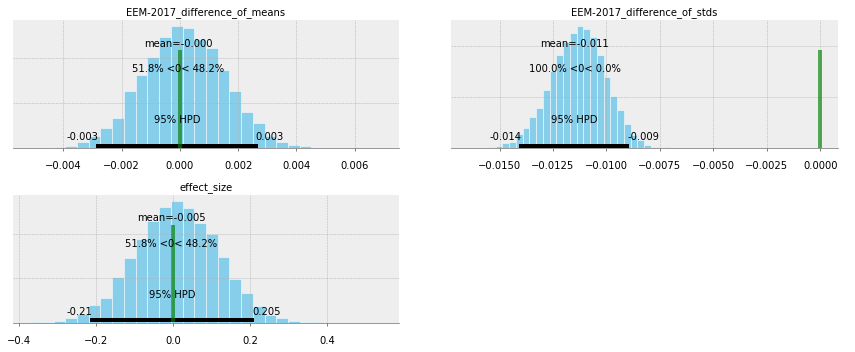

In [25]:
for sym in tqdm(nested_traces.keys(), desc=f'{sym} years'):
    for year,trc in nested_traces[sym].items():    
        plot_posteriors(trc, real_label=f'{sym}-{year}')

### The final test - Kolmogorov-Smirnov. 

Let's test this more rigorously. For this we will use the CDF of the returns and compare those with a fitted or empirical CDF using the kolmogorov-smirnov two sample test (`scipy.stats.kstest`). This test will allow us to moore definitively state whether the CDF of the two series come from the same distribution e.g. the Normal distribution. the kstest outputs the ks statistic and a p-value. P-values less than 0.05 means we have solid evidence to reject the null hypothesis that the two series were drawn from the same distribution. The smaller the p-value the more confident we are that they came from different distributions.

First we will analyze the entire return series, then compare the test across years.

#### KS Two Sample Test For All Years

In this example we will focus on `SPY` returns.

In [179]:
def plot_cdf(ser, **kwds):   
    """fn: to plot single CDF comparison
    
    Params
    ------
        ser : pd.Series()
    """
    def generate_norm_cdf(ser, N=None):
        if not N: N = ser.shape[0]
        x = np.linspace(ser.min(), ser.max(), N)
        y = stats.norm.cdf(x, ser.mean(), ser.std())
        return x, y
       
    # plot kde
    g = sns.kdeplot(ser, cumulative=True, lw=3, color=blue)
    
    x, y = generate_norm_cdf(ser) # generate fitted normal CDF
    g.plot(x, y, color=red, lw=3, label='fitted normal CDF')
    
    # two sided ks test
    #  https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kstest.html
    ks, p = stats.kstest(ser, 'norm', args=(ser.mean(), ser.std()))
    
    xmin,xmax=plt.gca().get_xlim()
    ymin,ymax=plt.gca().get_ylim()

    # add text
    txkw = dict(size=14, fontweight='medium', color='k', rotation=0)
    tx_N = ser.shape[0]
    tx_args = (ks, p, tx_N, ser.shape[0])
    tx = """
    ks two-sided test
    ks: {:.4f}, p: {:.4f}
    rvs sample N: {:.0f}
    return sample N: {:.0f}
    """.format(*tx_args)
    plt.text(xmax*0.2, 0.2*ymax, tx, **txkw)    
    
    sns.despine(offset=1)
    (plt.legend(frameon=True, prop={'weight':'demi', 'size':12})
     .get_frame()
     .set_edgecolor(blue))
    return

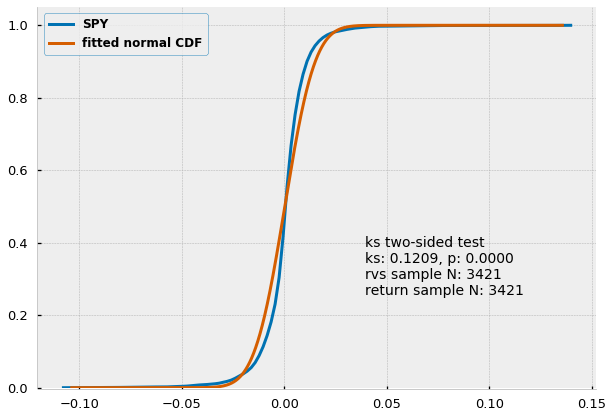

In [180]:
SYM = 'SPY'
plot_cdf(R[SYM])    

This further confirms our assumption that the `SPY` returns series are drawn from a distribution other than `normal`. Let's look at the same information by year.

#### KS Two-Sided Test By Year

In [182]:
def plot_facet_cdf(R, sym, **kwds):
    """fn: to plot single distro with fitted histograms using FacetGrid
    
    Params
    ------
        R : pd.DataFrame(), returns dataframe
        sym : str(), security/column name
    """
    g = (R
         .pipe(sns.FacetGrid, 
               col='year',
               col_wrap=2,
               size=5,
               aspect=1.3)
         .map(plot_cdf, sym, **kwds))
    g.add_legend()
    g.fig.subplots_adjust(hspace=.20, top=.99)
    sns.despine(offset=1)
    g.fig.suptitle(f'{sym}', y=1.01, x=0.45, fontweight='demi', fontsize=16)
    return

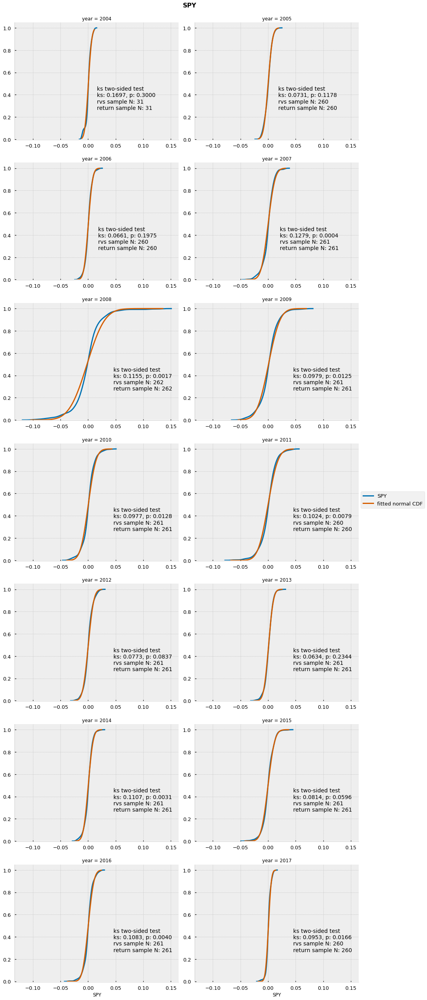

In [183]:
plot_facet_cdf(R, SYM)
#plt.savefig(f'./visuals/01_Motivation/spy return cdf compare with ecdf-kstest.png', dpi=300, bbox_inches='tight') 

From 2007-11 the kstest is pretty confident that the return CDF and the fitted normal ECDF are different as the p-values are smaller than our arbitrary threshold of 0.05. From 2012-13, and 2015 the kstest doesn't see a difference between them. And in 2014, and from 2016-17 the kstest tells us the returns are not normally distributed thus they are not IID or stationary.

### Examining Autocorrelation

Finally we can look for evidence of correlated data points by plotting the return series and its autocorrelation and partial autocorrelation function. First we'll plot the entire period, and then the faceted plots by year.

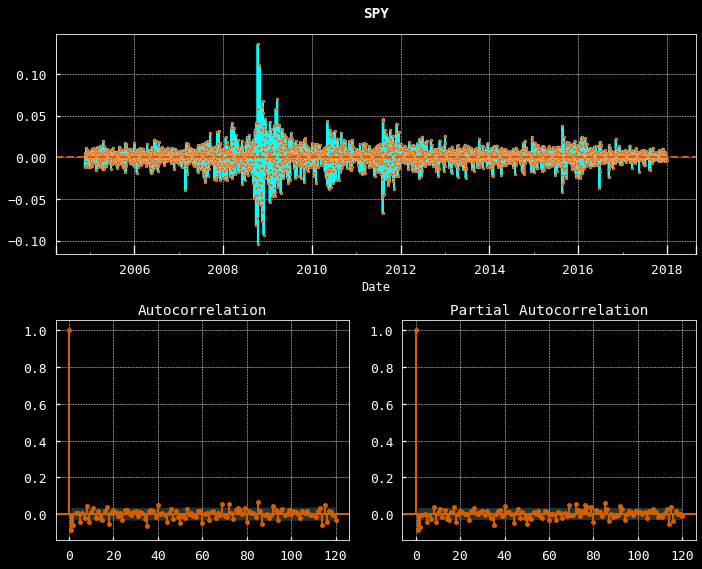

In [79]:
def tsplot(df, sym, lags=None, **kwds):
    
    y = df[sym]
    
    plt.style.use('dark_background')
    plt.rcParams['font.family'] = 'dejavu sans mono'        
        
    fig = plt.figure(figsize=(10,8))
    layout = (2, 2)
    ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
    acf_ax = plt.subplot2grid(layout, (1, 0))
    pacf_ax = plt.subplot2grid(layout, (1, 1))

    y.plot(ax=ts_ax, marker='o',c='cyan', ms=3.,
           markerfacecolor=red, markeredgecolor='white', markeredgewidth=.25)
    ts_ax.axhline(0, color=red, ls='--', lw=2.)
    ts_ax.tick_params(axis='x', size=9)
    ts_ax.set_title(f'{sym}', y=1.05, fontweight='demi')

    smt.graphics.plot_acf(y, lags=_lags, ax=acf_ax, alpha=0.05,
                          color=red, vlines_kwargs=dict(color=red))

    smt.graphics.plot_pacf(y, lags=_lags, ax=pacf_ax, alpha=0.05,
                           color=red, vlines_kwargs=dict(color=red))
    #pacf_ax.set_yticks([])

    plt.tight_layout()
    return

tsplot(R, SYM, lags=120);

In [ ]:
def facet_tsplot(df, sym, *args):
    """fn: to plot faceted timeseries plot using gridspec
    
    # Args 
        df : pd.DataFrame(), return data
        sym : str(), etf symbol
        _lags : numeric
        _years : array-like, list of years
        _dt : int(), number of columns
        _partial_len : int(), number of rows
    """
    plt.style.use('dark_background')
    
    fig = plt.figure(figsize=(25,40))
    outer_grid = gridspec.GridSpec(_partial_len, _dt)

    for i, year in zip(range(int(_partial_len*_dt)), _years):        
        
        y = df.query('year==@year')[sym]
        
        inner_grid = gridspec.GridSpecFromSubplotSpec(2, 2,
                                                      subplot_spec=outer_grid[i],
                                                      wspace=0.0, hspace=0.5)

        ts_ax = plt.Subplot(fig, inner_grid[0, :])
        acf_ax = plt.Subplot(fig, inner_grid[1, 0])
        pacf_ax = plt.Subplot(fig, inner_grid[1, -1])

        y.plot(ax=ts_ax, marker='o',c='cyan', ms=3.,
               markerfacecolor=red, markeredgecolor='white', markeredgewidth=.25)
        ts_ax.axhline(0, color=red, ls='--', lw=2.)
        ts_ax.tick_params(axis='x', size=9)
        ts_ax.set_title(f'{sym}-{year}', y=.8, fontweight='demi')

        smt.graphics.plot_acf(y, lags=_lags, ax=acf_ax, alpha=0.05,
                              color=red, vlines_kwargs=dict(color=red))

        smt.graphics.plot_pacf(y, lags=_lags, ax=pacf_ax, alpha=0.05,
                               color=red, vlines_kwargs=dict(color=red))
        pacf_ax.set_yticklabels([])

        fig.add_subplot(ts_ax)
        fig.add_subplot(acf_ax)
        fig.add_subplot(pacf_ax)

        sns.despine()

    plt.show()
    return

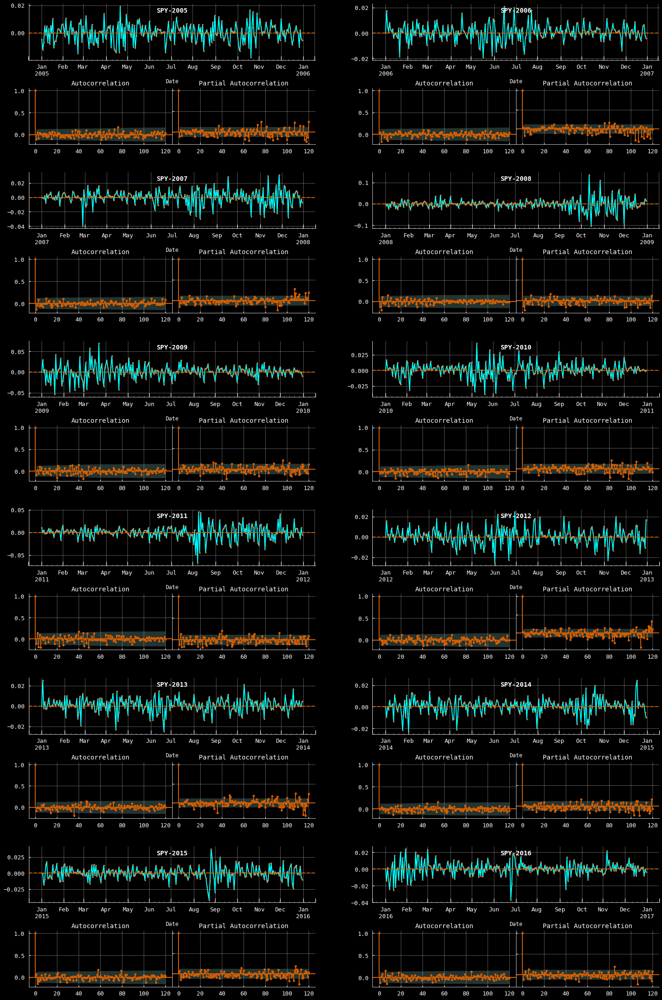

In [80]:
_years = np.arange(2005, R.year.max()) # 2005 is first full year
# array([2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016])

_dt = 2
_partial_len = int(len(_years)/_dt)
_lags = 120

facet_tsplot(R, SYM, _lags, _years, _dt, _partial_len)    
#plt.savefig(f'./visuals/01_Motivation/spy return faceted tsplot acf and pacf.png', dpi=300, bbox_inches='tight') 

So we can see clearly that SPY returns are nonstationary in the mean, in the variance, and demonstrate periods of variable autocorrelation. Furthermore we see the aggregate `SPY` return distribution is non-normal but at various smaller scales e.g. annually, there are periods of normality. 

### The Error of Using The Wrong Distributions Summary Metrics

So what happens when we try to use past returns approximated by a normal distribution's summary metrics (mean, variance) to predict future return distributions?

To explore this we'll use (`TimeSeriesSplit`) method from `sklearn`. This provides a walf-forward form of cross validation where previous data points, are used to predict the following period in sequence, thus preserving time dependent information. 

CPU times: user 10.5 s, sys: 6.19 s, total: 16.7 s
Wall time: 7.79 s


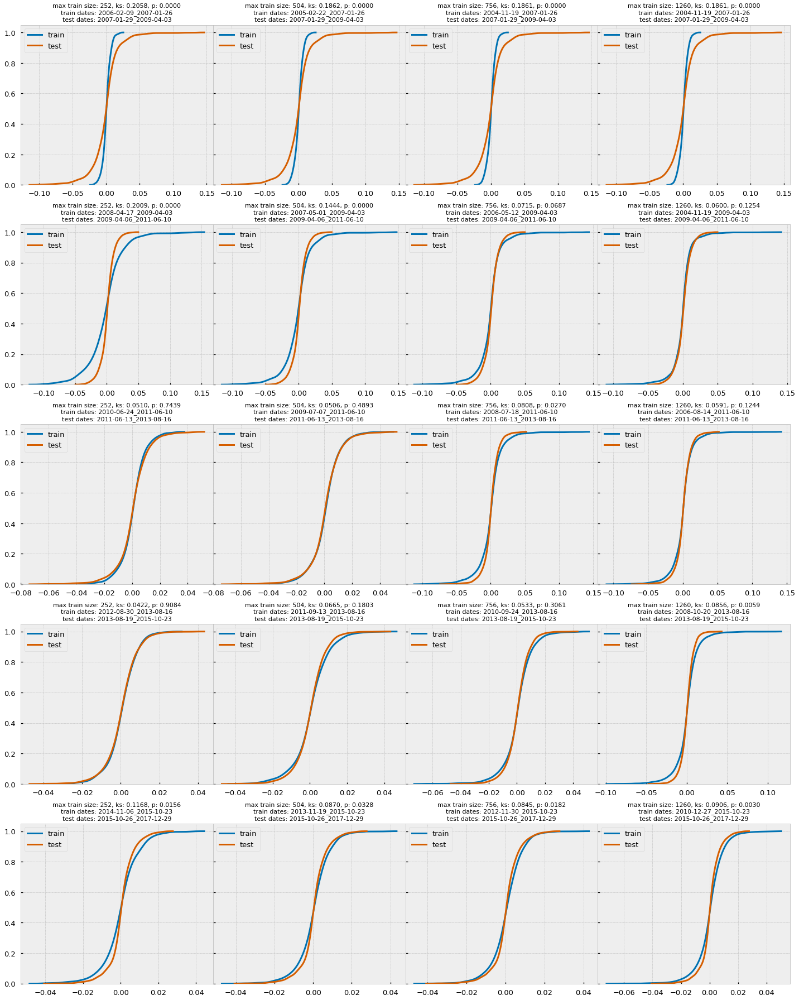

In [185]:
%%time

from sklearn.model_selection import TimeSeriesSplit

xx = R[SYM].copy() # pd series representing example data

_base = 252 # 1 trading year
_max_train_sizes = [_base*1, _base*2, _base*3, _base*5] # historical lookbacks
_n_split=5 # try with different values

gs = gridspec.GridSpec(_n_split, len(_max_train_sizes), wspace=0.0)

fig = plt.figure(figsize=(20,25))

rows = []
for j, max_size in enumerate(_max_train_sizes):
    tscv = TimeSeriesSplit(n_splits=_n_split, max_train_size=max_size)
    
    for i, (train, test) in enumerate(tscv.split(xx)):
        tmp_train = xx.iloc[train] # temporary train data
        tmp_test = xx.iloc[test] # temporary test data
        
        # get date ranges for datasets
        min_train_dt, max_train_dt = tmp_train.index.min(), tmp_train.index.max()
        min_test_dt, max_test_dt = tmp_test.index.min(), tmp_test.index.max()
        
        # compare train distro vs test distro 
        #   https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.ks_2samp.html
        ks, p = stats.ks_2samp(tmp_train, tmp_test) # get ks statistic and pvalue
        
        df_row = (max_size, ks, p,
                  min_train_dt.date(), max_train_dt.date(),
                  min_test_dt.date(), max_test_dt.date())
        rows.append(df_row) # append data for df
        
        tmp_ax = plt.subplot(gs[i, j]) # get temp ax from gridspec object
        
        # remove yticks except for first column
        if i in [0,1,2,3,4] and j != 0: tmp_ax.set_yticklabels([])
        # plot cdfs
        sns.kdeplot(tmp_train, cumulative=True, lw=3, color=blue, ax=tmp_ax, label='train')
        sns.kdeplot(tmp_test, cumulative=True, lw=3, color=red, ax=tmp_ax, label='test')
        plt.title('max train size: {}, ks: {:.4f}, p: {:.4f}\ntrain dates: {}_{}\ntest dates: {}_{}'
                  .format(max_size, ks, p,
                          min_train_dt.date(), max_train_dt.date(),
                          min_test_dt.date(), max_test_dt.date()), 
                  fontsize=11.)
        plt.subplots_adjust(top=1.03) # adjust title spacing
        plt.tight_layout()
#plt.savefig(f'./visuals/01_Motivation/spy return cdf compare-time series split {_n_split} folds-kstest.png',
#            dpi=300, bbox_inches='tight') 

We can see how varied the CDF for train and test periods are throughout the different lookback periods, including times where they sync up exactly. To quantify our observations, we can create a dataframe containing the output of the ks test along with the information on the lookback periods and the data splits.

In [186]:
def color_if_diff_dist(val, alpha=0.05):
    """
    Takes a scalar and returns a string with
    the css property `'color: red'` for values 
    less than alpha, black otherwise.
    """
    color = 'darkgreen' if val < alpha else 'k'
    return 'color: %s' % color

def highlight_diff_dist(val, alpha=0.05):
    """
    highlight the values less than alpha as yellow.
    """
    color = 'yellow' if val < alpha else ''
    return 'background-color: %s' % color

# create data table with ks test results and ts information
cols = ['max_size', 'ks', 'p', 
        'min_train_dt', 'max_train_dt',
        'min_test_dt', 'max_test_dt']
tss_ks_df = pd.DataFrame(rows, columns=cols)

(tss_ks_df.style
 .applymap(color_if_diff_dist, subset=['p'])
 .applymap(highlight_diff_dist, subset=['p']))

,max_size,ks,p,min_train_dt,max_train_dt,min_test_dt,max_test_dt
0,252,0.205764,5.61565e-07,2006-02-09,2007-01-26,2007-01-29,2009-04-03
1,252,0.200919,1.13326e-06,2008-04-17,2009-04-03,2009-04-06,2011-06-10
2,252,0.0509607,0.743903,2010-06-24,2011-06-10,2011-06-13,2013-08-16
3,252,0.0422306,0.908436,2012-08-30,2013-08-16,2013-08-19,2015-10-23
4,252,0.11675,0.0155524,2014-11-06,2015-10-23,2015-10-26,2017-12-29
5,504,0.186236,1.31022e-08,2005-02-22,2007-01-26,2007-01-29,2009-04-03
6,504,0.144382,2.4121e-05,2007-05-01,2009-04-03,2009-04-06,2011-06-10
7,504,0.0506266,0.489297,2009-07-07,2011-06-10,2011-06-13,2013-08-16
8,504,0.0665414,0.180295,2011-09-13,2013-08-16,2013-08-19,2015-10-23
9,504,0.0869883,0.0327796,2013-11-19,2015-10-23,2015-10-26,2017-12-29


We can now examine the percentage of train/test pairs that reject the null hypothesis at alpha equal to 0.05 and 0.01.

In [187]:
get_pct_reject = lambda df, col, alpha: df.query(f'{col} < {alpha}').shape[0] / df.shape[0]

a1 = 0.05
a2 = 0.01

# percentage of rejected null hypothesis that the samples came from the same e.g. Normal distro
#  at alphas 0.05 and 0.01 respectively
get_pct_reject(tss_ks_df, 'p', a1), get_pct_reject(tss_ks_df, 'p', a2) 

(0.6, 0.4)

Unsurprisingly the results are terrible. 60% of the train/test pairs reject the null hypothesis that the training and testing data came from the same distribution. This proves that if we were to apply the mean, variance parameters of the training data to predict the test data return distribution we're going to wrong a lot of the time.

For fun we can look at the periods where the kstest accepts the null hypothesis and see if any patterns jump out.

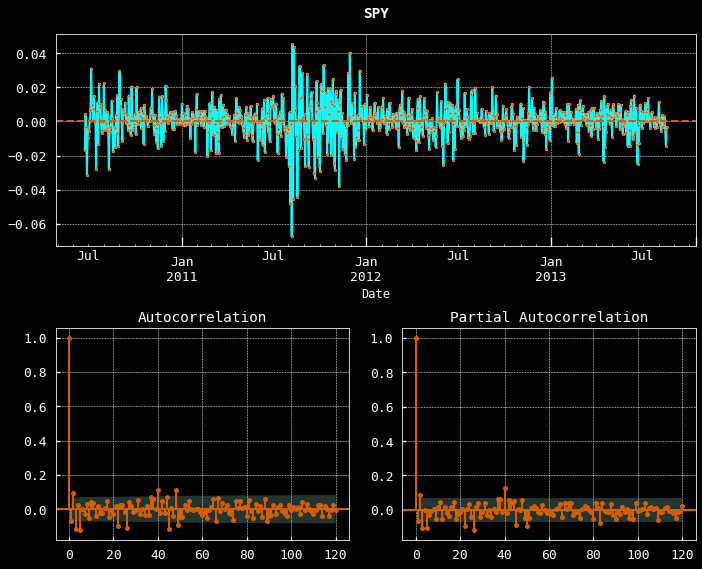

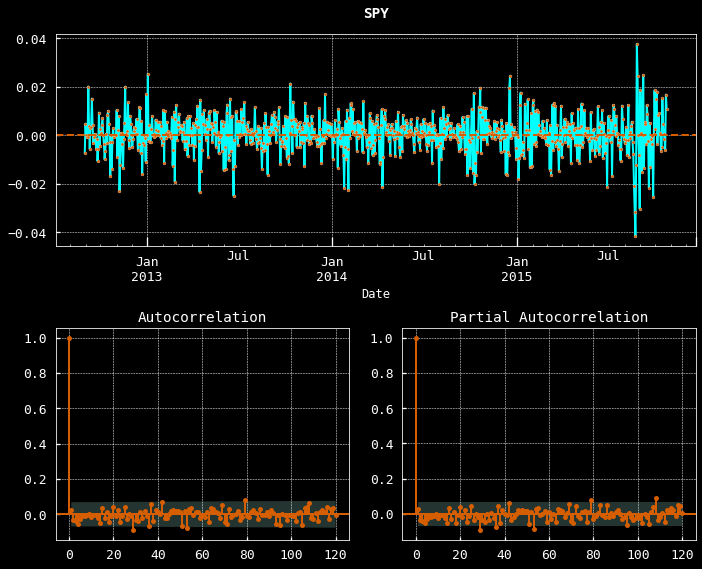

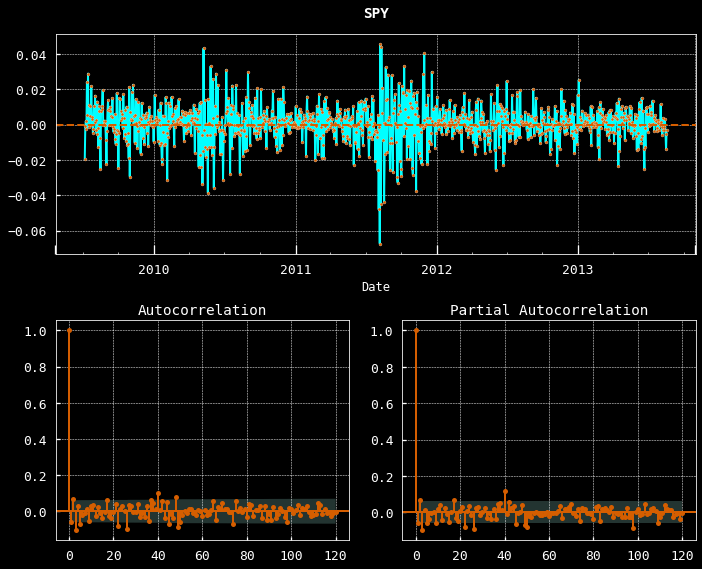

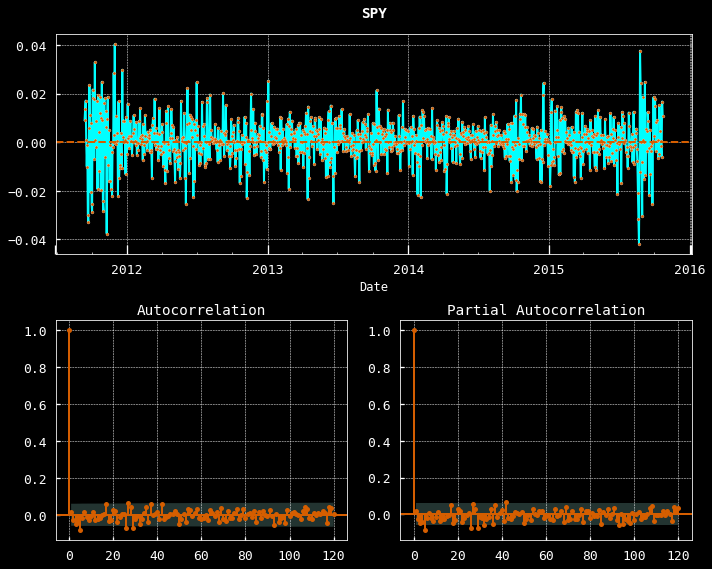

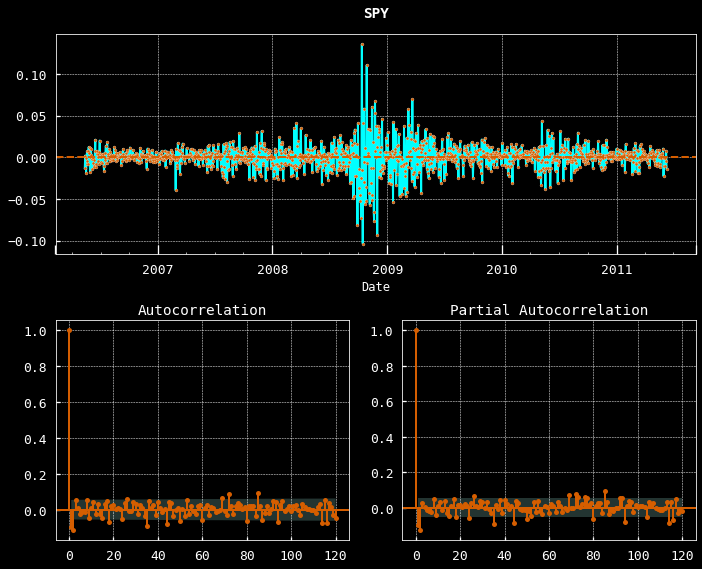

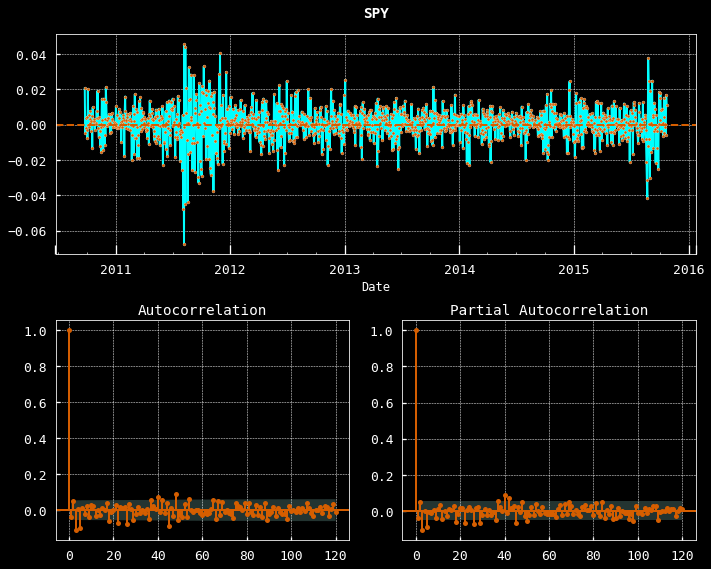

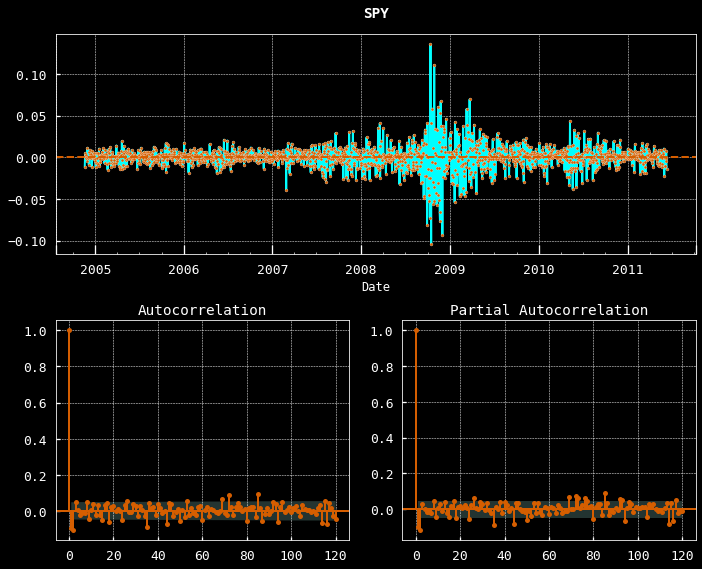

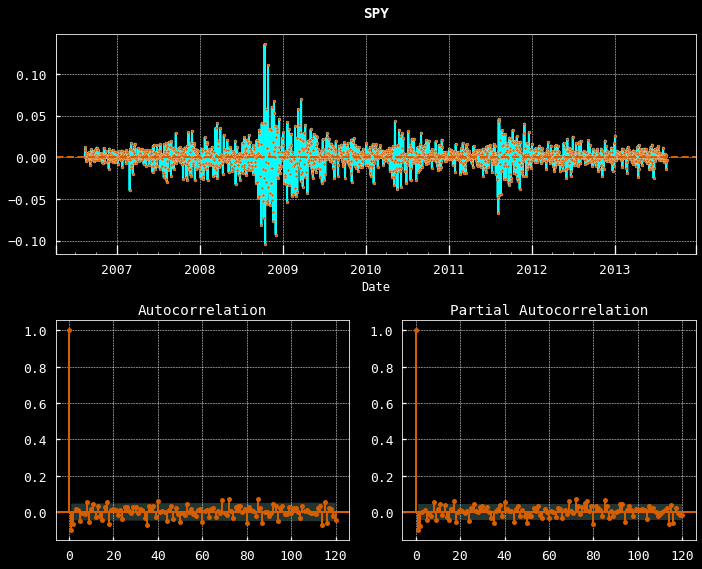

In [87]:
for row in tss_ks_df.query('p>@a1').itertuples():
    tmp_R = R.loc[pd.to_datetime(row.min_train_dt):pd.to_datetime(row.max_test_dt)]
    tsplot(tmp_R, SYM)

At a glance, it looks like the `ks_2samp` test was likely to accept the null hypothesis when the training and test periods contained significant periods of lower, stable volatility, *or* when the high volatility periods were split among both training and testing periods.

## 4. TODO: UPDATE Conclusions

We've seen that SPY returns are sometimes normal but mostly non-normally distributed, that the means and variances are not stationary, and that there is autocorrelation between returns at differing lags, and multiple time scales. We've also seen how there is potential for large errors/losses if we assume that the return distribution from the previous period(s) to the next are the same because in most cases they are not.

Hopefully this notebook shows that there is a need for a modeling framework that can overcome these challenges in a robust manner. In the next chapter I will demonstrate how mixture models approach these issues and then benefits they bring to this task.